# K factor analysis

In transportation planning, the percentage of AADT that occurs during the peak is referred to as the K factor, and the standard for planning analyses is 9%. Relatedly, the D factor is the directional distribution, standard is 55%.

In [1]:
using CSV
using Parquet
using DataFrames
using Plots
using Dates
using CategoricalArrays
using Missings
using Random
using Statistics
using StatsBase
using Glob
using Latexify

include("../code/KFactors.jl")
using .KFactors

In [2]:
data = read_data("../data/all_district_peaks.parquet", "../data/sensor_meta_geo.csv")

┌ Info: Observations in each period
│   combine(groupby(data, :period), nrow) = 4×2 DataFrame
 Row │ period        nrow     
     │ Cat…?         Int64    
─────┼────────────────────────
   1 │ missing       33374822
   2 │ pandemic        600398
   3 │ postpandemic    610746
   4 │ prepandemic    2345492
└ @ Main.KFactors /Users/matthewc/OneDrive - University of North Carolina at Chapel Hill/peak_spreading/code/KFactors.jl:67
┌ Info: Before filtering, data has 36931458 rows
└ @ Main.KFactors /Users/matthewc/OneDrive - University of North Carolina at Chapel Hill/peak_spreading/code/KFactors.jl:78
┌ Info: After filtering, data has 1058197 rows
└ @ Main.KFactors /Users/matthewc/OneDrive - University of North Carolina at Chapel Hill/peak_spreading/code/KFactors.jl:96


,station,peak_hour_occ,total_occ,total_flow,station_type,freeway_number,direction
,Int64?,Float64?,Float64?,Int64?,String?,Int64?,String?
1,311903,0.223887,17.5816,58664,ML,50,E
2,311974,0.141825,27.0884,119951,ML,50,E
3,312010,0.117785,30.8537,126821,ML,50,W
4,312098,0.15065,14.999,81951,ML,50,E
5,312103,0.139201,27.9602,111184,ML,50,W
6,312132,0.0835256,14.0448,29177,ML,5,S
7,312133,0.175712,13.764,40745,ML,5,N
8,312134,0.0979794,20.3706,37619,ML,5,N
9,312139,0.130753,31.0624,131499,ML,50,E


# Overall congestion

In [3]:
# https://identity.unc.edu/brand/color-palette/
const UNC_BLUE = RGB(75/255, 156/255, 211/255)
const UNC_NAVY = RGB(19/255, 41/255, 75/255)
const UNC_DAVIE_GREEN = RGB(196/255, 214/255, 0/255)
const UNC_PINK = RGB(239/255, 68/255, 111/255)

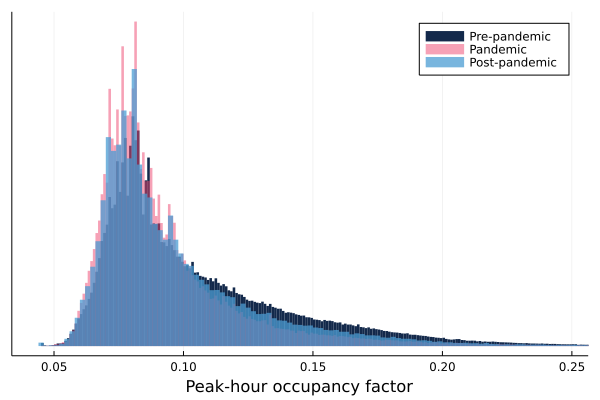

In [4]:
histogram(data.peak_hour_occ[data.period .== "prepandemic"], xlim=[0.04, 0.25], fillcolor=UNC_NAVY, lw=0, label="Pre-pandemic", normalize=true,
    xlabel="Peak-hour occupancy factor",
    yticks=[]
)
histogram!(data.peak_hour_occ[data.period .== "pandemic"], xlim=[0.04, 0.25], fillcolor=UNC_PINK, lw=0, alpha=0.5, label="Pandemic", normalize=true)
histogram!(data.peak_hour_occ[data.period .== "postpandemic"], xlim=[0.04, 0.25], fillcolor=UNC_BLUE, lw=0, alpha=0.75, label="Post-pandemic", normalize=true)

In [8]:
prex, prey = KFactors.cumulative_dist(data.peak_hour_occ[data.period .== "prepandemic"], data.total_flow[data.period .== "prepandemic"])
durx, dury = KFactors.cumulative_dist(data.peak_hour_occ[data.period .== "pandemic"], data.total_flow[data.period .== "pandemic"])
postx, posty = KFactors.cumulative_dist(data.peak_hour_occ[data.period .== "postpandemic"], data.total_flow[data.period .== "postpandemic"])

plot(prex, prey, linecolor=UNC_NAVY, label="Pre-pandemic", xlim=[1/24, 0.25], legend=:bottomright)
plot!(durx, dury, linecolor=UNC_PINK, label="Pandemic")
plot!(postx, posty, linecolor=UNC_BLUE, label="Post-pandemic")


In [9]:
savefig("../fig/cumulative_dist.pdf")

In [10]:
data_prepost = data[in.(data.period, [Set(["prepandemic", "postpandemic"])]), :]

,station,peak_hour_occ,total_occ,total_flow,station_type,freeway_number,direction
,Int64?,Float64?,Float64?,Int64?,String?,Int64?,String?
1,311903,0.223887,17.5816,58664,ML,50,E
2,311974,0.141825,27.0884,119951,ML,50,E
3,312010,0.117785,30.8537,126821,ML,50,W
4,312098,0.15065,14.999,81951,ML,50,E
5,312103,0.139201,27.9602,111184,ML,50,W
6,312132,0.0835256,14.0448,29177,ML,5,S
7,312133,0.175712,13.764,40745,ML,5,N
8,312134,0.0979794,20.3706,37619,ML,5,N
9,312139,0.130753,31.0624,131499,ML,50,E


In [11]:
# use -1 as missing value to prevent bounds errors in indexing below, you can't index with missing
data_prepost.District = coalesce.(data_prepost.District, [-1])
begin end

In [19]:
# there shouldn't be any stations missing districts - investigate
unique(data.station[ismissing.(data.District)])

18-element Vector{Union{Missing, Int64}}:
    312530
    317896
 501010124
    601372
    602372
    615821
    615841
    619981
    619983
    619984
    619987
    629987
    629991
    629993
    629994
   1037910
   1038010
   1016710

In [20]:
permutation_tests = DataFrame([
    (label="Overall", permutation_test(data_prepost)...),
    # some stations missing geo info, don't include in either urban or rural
    (label="Urban", permutation_test(data_prepost[coalesce.(data_prepost.urban, [false]), :])...),
    (label="Rural", permutation_test(data_prepost[coalesce.(.!data_prepost.urban, [false]), :])...),
    (label="District 3 (Sacramento)", permutation_test(data_prepost[data_prepost.District .== 3, :])...),
    (label="District 10 (Stockton)", permutation_test(data_prepost[data_prepost.District .== 10, :])...),
    (label="District 4 (San Francisco Bay Area)", permutation_test(data_prepost[data_prepost.District .== 4, :])...),
    (label="District 5 (Central Coast)", permutation_test(data_prepost[data_prepost.District .== 5, :])...),
    # The Freakersfield district
    (label="District 6 (Fresno / Bakersfield)", permutation_test(data_prepost[data_prepost.District .== 6, :])...),
    (label="District 7 (Los Angeles)", permutation_test(data_prepost[data_prepost.District .== 7, :])...),
    (label="District 12 (Orange County)", permutation_test(data_prepost[data_prepost.District .== 12, :])...),
    (label="District 8 (Inland Empire)", permutation_test(data_prepost[data_prepost.District .== 8, :])...),
    (label="District 11 (San Diego)", permutation_test(data_prepost[data_prepost.District .== 11, :])...)
])

,label,ptest,pval,n_sensors
,String,Float64,Float64,Int64
1,Overall,-0.00856135,0.0,9061


In [68]:
permutation_tests_fmt = permutation_tests[:,:]
permutation_tests_fmt.ptest = round.(permutation_tests_fmt.ptest, sigdigits=2)
permutation_tests_fmt.pval = round.(permutation_tests_fmt.pval, sigdigits=2)
latexify(permutation_tests_fmt, env=:table, latex=false, booktabs=true)

L"\begin{tabular}{cccc}
\toprule
label & ptest & pval & n_sensors\\
\midrule
Overall & -0.0086 & 0.0 & 9061\\
Urban & -0.011 & 0.0 & 3981\\
Rural & -0.0066 & 0.0 & 5057\\
District 3 (Sacramento) & -0.014 & 0.0 & 520\\
District 10 (Stockton) & -0.0071 & 0.0 & 633\\
District 4 (San Francisco Bay Area) & -0.013 & 0.0 & 2390\\
District 5 (Central Coast) & 0.00033 & 0.69 & 364\\
District 6 (Fresno / Bakersfield) & -0.0041 & 0.0 & 500\\
District 7 (Los Angeles) & -0.0066 & 0.0 & 1890\\
District 12 (Orange County) & -0.013 & 0.0 & 958\\
District 8 (Inland Empire) & 0.00051 & 0.47 & 1086\\
District 11 (San Diego) & -0.012 & 0.0 & 702\\
\bottomrule
\end{tabular}
"

In [66]:
permutation_tests_fmt = permutation_tests[:,:]
permutation_tests_fmt.ptest = round.(permutation_tests_fmt.ptest, sigdigits=2)
permutation_tests_fmt.pval = round.(permutation_tests_fmt.pval, sigdigits=2)
latexify(permutation_tests_fmt, env=:mdtable, latex=false, booktabs=true)

|                               label |   ptest | pval | n_sensors |
| -----------------------------------:| -------:| ----:| ---------:|
|                             Overall | -0.0086 |  0.0 |      9061 |
|                               Urban |  -0.011 |  0.0 |      3981 |
|                               Rural | -0.0066 |  0.0 |      5057 |
|             District 3 (Sacramento) |  -0.014 |  0.0 |       520 |
|              District 10 (Stockton) | -0.0071 |  0.0 |       633 |
| District 4 (San Francisco Bay Area) |  -0.013 |  0.0 |      2390 |
|          District 5 (Central Coast) | 0.00033 | 0.69 |       364 |
|   District 6 (Fresno / Bakersfield) | -0.0041 |  0.0 |       500 |
|            District 7 (Los Angeles) | -0.0066 |  0.0 |      1890 |
|         District 12 (Orange County) |  -0.013 |  0.0 |       958 |
|          District 8 (Inland Empire) | 0.00051 | 0.47 |      1086 |
|             District 11 (San Diego) |  -0.012 |  0.0 |       702 |


In [14]:
# why so many with missing district? where did they come from? not in sensor_meta? old stations that have gone offline?
combine(groupby(data, :District), nrow)

,District,nrow
,Int64?,Int64
1,3,60198
2,4,283512
3,5,36409
4,6,56777
5,7,223389
6,8,129495
7,10,70622
8,11,83819
9,12,111937


## Plot the permutation test

In [16]:
@time means = KFactors.permute!(data_prepost, 1000)
diff_means = means[1, :] .- means[2, :]

 92.232020 seconds (216.87 M allocations: 13.123 GiB, 5.08% gc time, 4.00% compilation time)


1000-element Vector{Float64}:
  0.0008626746653096901
  0.0005497252987683027
 -0.0009704282419426002
 -0.0011512307415764977
  0.0007831173813855757
 -0.0010374524340528435
 -0.0011205450983281656
  0.0003904830844913554
  0.0005271202789696172
  5.0122837967292444e-5
  0.001923799425019107
  0.0009997868054767434
 -0.0006862187112314788
  ⋮
 -7.958981085171013e-5
 -0.0009014589674557483
 -0.002042966110417904
 -0.0021200201184145423
  0.0006827350071887117
  0.001975730379522561
 -0.001065955508740099
 -0.0009389885893171523
  0.00018930954512330622
  0.0003926681549651645
  0.0012591062431246275
  0.00019370064409929277

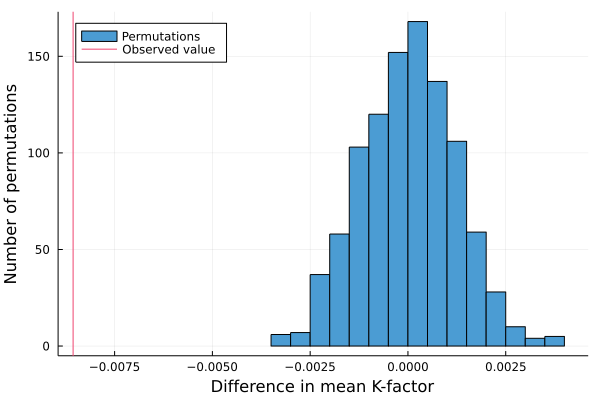

In [33]:
histogram(diff_means, color=UNC_BLUE, label="Permutations", legend=:topleft, xlabel="Difference in mean K-factor", ylabel="Number of permutations")
test_stat = permutation_tests[permutation_tests.label .== "Overall", "ptest"][1]
vline!([test_stat], color=UNC_PINK, label="Observed value")

In [34]:
savefig("../fig/permutation_histogram.pdf")

## OLD CODE BELOW HERE

## Disaggregation

- Urban/rural
- Speed limit
- Overall congestion

In [33]:
k_factor_by_sensor = combine(groupby(data, [:period, :station]), :peak_hour_occ => mean => :peak_hour_occ, :peak_hour_occ_var => first => :peak_hour_occ_var)

LoadError: ArgumentError: column name :peak_hour_occ_var not found in the data frame

In [34]:
k_factor_by_sensor = unstack(k_factor_by_sensor, :station, :period, :peak_hour_occ)

LoadError: UndefVarError: k_factor_by_sensor not defined

In [35]:
sensor_meta = leftjoin(sensor_meta, combine(groupby(data, :station), :peak_hour_occ_var => first => :peak_hour_occ_var), on=:ID=>:station)

LoadError: ArgumentError: column name :peak_hour_occ_var not found in the data frame

In [36]:
sensor_map = leftjoin(sensor_meta, k_factor_by_sensor, on=:ID => :station)

LoadError: UndefVarError: k_factor_by_sensor not defined

In [37]:
sensor_map.pre_post = sensor_map.postpandemic - sensor_map.prepandemic

LoadError: UndefVarError: sensor_map not defined

In [38]:
CSV.write("../data/k_factor_map_all2.csv", dropmissing(sensor_map, [:pre_post, :pandemic, :Latitude, :Longitude]))

LoadError: UndefVarError: sensor_map not defined

In [39]:
# there are way too many of some values - probably due to imputation
# robustness checks (TODO):
# - remove imputed data
# - check if imputation frequency changed pre-post pandemic
sort(combine(groupby(data, :peak_hour_occ), nrow), :nrow, rev=true)

,peak_hour_occ,nrow
,Float64?,Int64
1,0.0806881,3282
2,0.0852978,2761
3,0.0817829,2690
4,0.086381,2673
5,0.0836757,2639
6,0.0816834,2615
7,0.0827498,2360
8,0.0797052,2302
9,0.07733,2272


### Disaggregation by time of peak

* Assign each peak hour start to AM or PM (morning or afternoon) for each sensor per day.
* Look at distribution of percent AM/PMs. We expect this to be strongly bimodal (few places where AM/PM peaks are equally likely)
* Compare distributions pre-post pandemic.
* Separate permutation tests for AM/PM road segments.
* Correlations between peakiness change and AM/PM.

In [40]:
data.AM = data.peak_hour_start .< Time(11, 30, 0)

1058197-element BitVector:
 1
 1
 0
 1
 0
 0
 1
 0
 1
 0
 1
 1
 1
 ⋮
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0

In [41]:
proportion_AM_by_station = combine(groupby(data, :station), :AM => mean)

,station,AM_mean
,Int64?,Float64
1,311903,0.132231
2,311974,0.025
3,312010,0.05
4,312098,0.0901639
5,312103,0.0894309
6,312132,0.0327869
7,312133,0.68595
8,312134,0.466667
9,312139,0.025


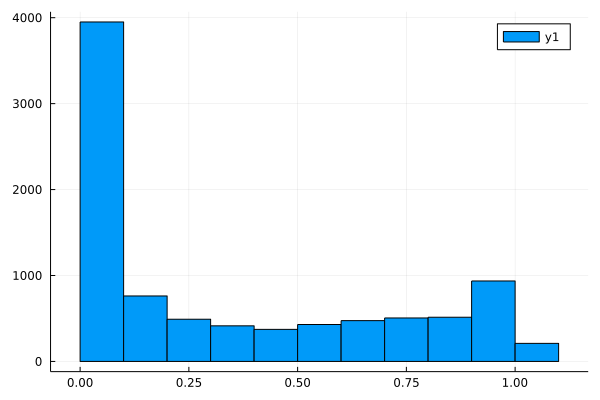

In [42]:
histogram(proportion_AM_by_station.AM_mean)

^ PM peaks are much less common than AM peaks, so this covariate isn't as interesting to us as we originally thought.

### Variance in peak occupancy by sensor

We will compute the variance in the peak occupancy by sensor, and use this to perform a robustness check where we remove sensors that vary a lot in their peak occupancies. Those sensors might be corrupted or simply have unusual traffic patterns.


In [43]:
transform!(groupby(data, :station), :peak_hour_occ => var)

,station,peak_hour_occ,total_occ,total_flow,station_type,freeway_number,direction
,Int64?,Float64?,Float64?,Int64?,String?,Int64?,String?
1,311903,0.223887,17.5816,58664,ML,50,E
2,311974,0.141825,27.0884,119951,ML,50,E
3,312010,0.117785,30.8537,126821,ML,50,W
4,312098,0.15065,14.999,81951,ML,50,E
5,312103,0.139201,27.9602,111184,ML,50,W
6,312132,0.0835256,14.0448,29177,ML,5,S
7,312133,0.175712,13.764,40745,ML,5,N
8,312134,0.0979794,20.3706,37619,ML,5,N
9,312139,0.130753,31.0624,131499,ML,50,E


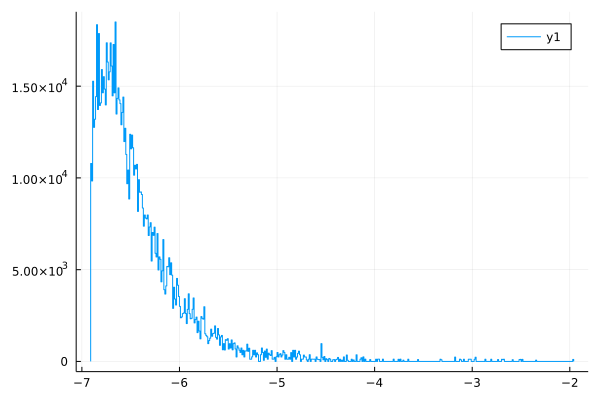

In [44]:
histogram(log.(data.peak_hour_occ_var .+ .001))

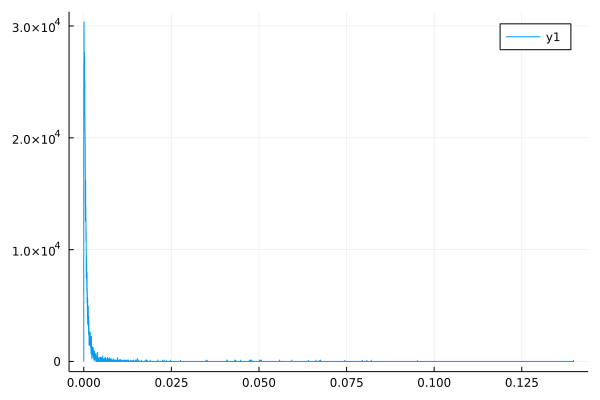

In [45]:
histogram(data.peak_hour_occ_var)

In [46]:
?percentile

search: percentile



```
percentile(x, p)
```

Return the `p`th percentile of a collection `x`, i.e. `quantile(x, p / 100)`.


In [47]:
percentile(data.peak_hour_occ_var, 75)

0.0009123373359494111

In [48]:
scatter(data.peak_hour_occ_var, data.peak_hour_occ, xlab="var", ylab="occ", xlim())

LoadError: UndefVarError: xlim not defined